# Scripting Gruppe 5
# Hat die Sonnenscheindauer pro Kanton einen Einfluss auf die Strom- und Mietpreise?​

## Team
---
- Kevin Gamuzza
- Fabrice Würsten
- Alice Allenspach




## Background
---
Die Sonnenscheindauer variiert in der Schweiz zwischen den Kantonen/Gemeinden und könnte die Strom- und Mietpreise beeinflussen. Höhere Sonnenscheindauer könnte zu niedrigeren Strompreisen durch verstärkte Solarenergieproduktion führen. Gleichzeitig könnte eine höhere Nachfrage nach Wohnraum in sonnigen Regionen die Mietpreise steigen lassen.



## Business Case
---
Untersucht wird, ob ein Einfluss der Sonnenscheindauer auf die Strom- und Mietpreise besteht. Ziel ist es, herauszufinden, ob Kantone/Gemeinden mit attraktiven Miet- und Strompreisen auch eine hohe Sonnenscheindauer aufweisen.



## Datasets
---
- https://www.hev-schweiz.ch/vermieten/nebenkostenabrechnungen/sonnenscheindauer
- https://opendata.swiss/de/dataset/median-strompreis-per-kanton
- https://www.hev-schweiz.ch/vermieten/statistiken/mietpreise/durchschnittliche-mietpreise


## Das Laden der Daten
---
Wie bereits oben ersichtlich, wurden für diese Arbeit drei verschiedene Datensets verwendet. Die Strompreise konnten bequem per Excel nach dem kreieren eines Accounts heruntergeladen werden. Die beiden anderen waren jedoch nur in Form einer HTML-Tabelle verfügbar. Glücklicherweise haben wir das sogenannte Web-Scraping mittels der Bilbiothek BeautifulSoup im Unterricht kennengelernt. Hierbei ist das lokalisieren der korrekten Tabellen mittels Klassenbezeichner relativ einfach. Da die meisten Seiten heutzutage nicht mehr "von Hand" in HTML geschrieben, sondern automatisiert erstellt werden, war es teilweise recht aufwändig sich durch die dutzenden von Divs zu klicken bis man auf der eigentlichen Tabelle angelangt war.

Obwohl wir nur zwei HTML-Tabellen auszulesen hatten, wurde versucht auf Code-Duplizierung zu verzichten. Anstatt also die beiden Tabellen in Form eines Batch-Programm auszulesen, wurden die beiden wichtigesten Funktionen (das scrapen der Tabellen und das überführen deren Daten in Listen) in Form von einzelnen Funktionen ausgelagert. So konnten die beiden Tabellen in einer for-Schlaufe durch die URL-Liste augelesen werden. Nur die jeweiligen Eigenheiten, welche für die Bezeichnung der Excel-Register benötigt wurden, wurden in Form einer einfachen IF-Else Entscheidung mitgegeben. Würde die URL-Liste mehr als Zwei Elemente haben, wäre vermutlich ein match-case Statement besser zu lesen.

Unten sieht man, wie das Programm durch die Liste mit den URL's (urls) iteriert. Wenn es sich um das Element mit Index 0 (urls[0]) handelt. Wird der entsprechende Dateiname sowie die Registernamen in Form des Jahres verwendet. Da die Header der Tabelle bereits im DataFrame ist, wurde auf das automatische erstellen eines Headers (header=false) verzichtet. Zum schreiben der Excel-Datei wurde die Schreibfunktion von Pandas verwendet.

In [ ]:
for url in urls:
  if url == urls[0]:
    filepath = Path('/content/drive/My Drive/ie_scripting_datasets/Sonnenscheindauer.xlsx')
    filepath.parent.mkdir(parents=True, exist_ok=True)
    all_dataframes = get_dataframes(url)
    year = 2024
    with pd.ExcelWriter(filepath) as writer:
      for dataframe in all_dataframes:
        dataframe.to_excel(writer, sheet_name=str(year), index=False, header=False)
        year = year - 1

## Google Drive einbinden
---
Dieser Codeabschnitt stellt eine Verbindung zu Google Drive her und ermöglicht den Zugriff auf die Dateien innerhalb der Colab-Umgebung.

In [ ]:
# Herstellung der Verbindung auf Google Drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# Import der Funktion, um Bilder anzuzeigen
from IPython.display import Image

Mounted at /content/drive


**Nachdem ausführen von:**

```
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
```

**ist die Vergabe aller 8 Berechtigungen ist für die Einbindung des Google Drive Ordners zwingend:**


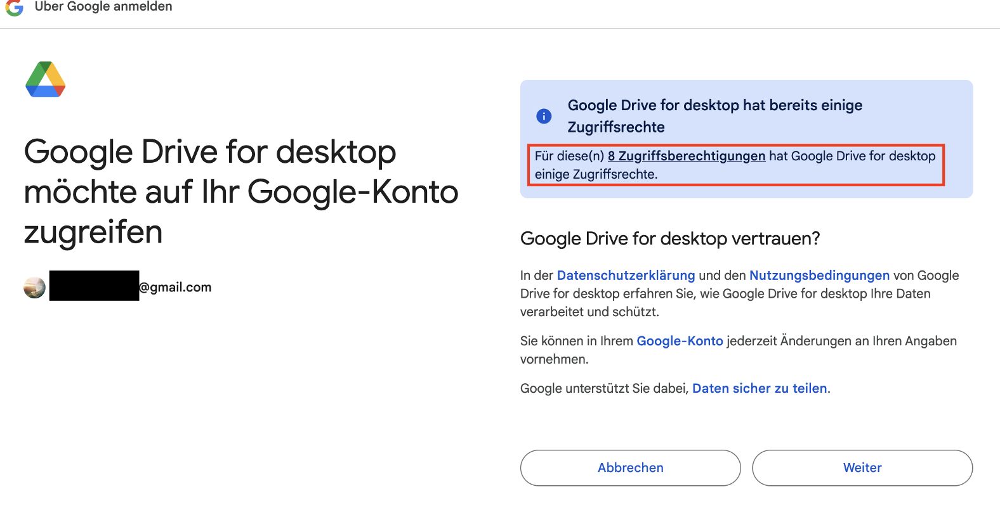

#Herausforderungen bei der Aggregation der Daten
---

Es bestand keine Gewissheit, dass die drei Datasets jeweils alle Kantone mit Sonnen-, Strom- und Mietdataten abdecken. Checks zeigten, dass für einige Kantone keine Sonnenscheindaten vorhanden waren.

Zudem verfügten die drei Datasets  über keinen gemeinsamen Key. Daher mussten die Tabellen mit einem gemeinsamen Key "canton_short_name" ergänzt und schlussendlich zusammengeführt werden werden.


#Fehlende Sonnenscheindaten

Ein initialer visueller Check durch plotten aller Wetterstationen des Datasets mittels "Nomatim" Library auf einer Karte erlaubte die Vermutung, dass alle Kantone abgedeckt sind was sich jedoch als falsch herausstellte.

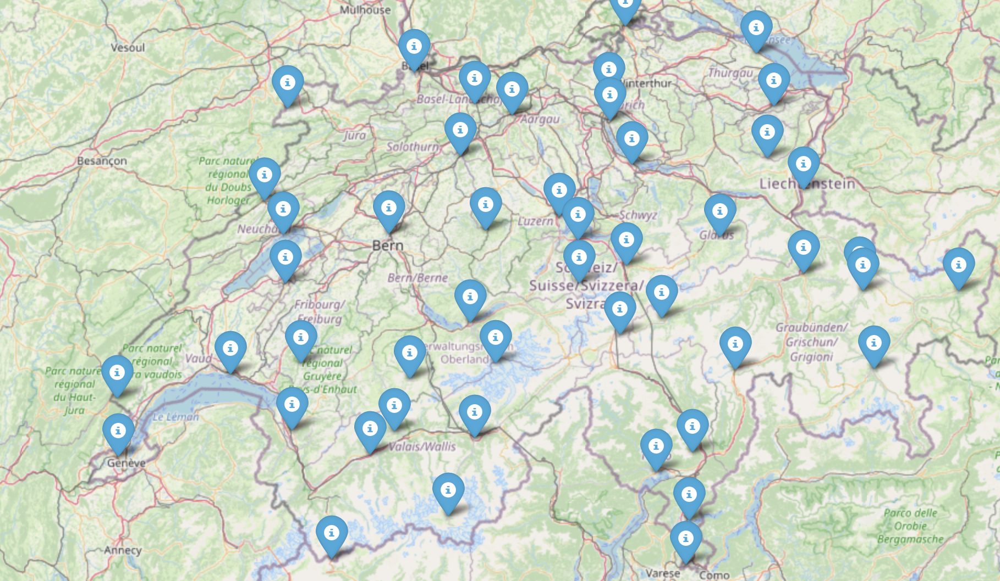

In [ ]:
# Zeige das Bild an, das im angegebenen Pfad gespeichert ist
Image(filename='/content/drive/MyDrive/ie_scripting_datasets/weather_station_map.png')

Als Basis um die Wetterstationen auf Kantone Mappen zu können musste eine Liste aller Gemeinden und derer Kantonszugehörigkeit via API importiert werden:

API Source: https://www.agvchapp.bfs.admin.ch/de#:~:text=Gemeinde%20abgefragt%20werden.-,Gemeindestand,-XLSX%2001.01.2024

Das erstellte skript liest ein File mit allen Gemeinden ein und bildet die Basis für das spätere Mapping aller Stationen auf Kantone und die Identifikation fehlender Kantone in der Liste von Wetterstationen.



```
import requests
import pandas as pd
import warnings
def get_all_municipalities():
  # Suppress the specific warning about the default style in openpyxl
  warnings.simplefilter("ignore", UserWarning)

  # Define the URL for the POST request (replace with the exact form action URL)
  url = "https://www.agvchapp.bfs.admin.ch/de/state/results/xls?SnapshotDate=01.01.2024"

  # Send the POST request to download the file containing all swiss municipalities
  response = requests.post(url)

  # Check if the request was successful
  if response.status_code == 200:
      # Save the content as an Excel file locally
      with open("gemeinden.xlsx", "wb") as file:
          file.write(response.content)

      # Load the downloaded Excel file into a DataFrame
      try:
          df_gemeinden = pd.read_excel("gemeinden.xlsx", engine='openpyxl')
          # Display the first few rows of the DataFrame
          display(df_gemeinden.head())
      except Exception as e:
          print("An error occurred while reading the Excel file:", e)
  else:
      print("Failed to download the file. Status code:", response.status_code)

  return df_gemeinden
```




#Identifikation der fehlenden Kantone und Strategie zum Mapping der Sonnenscheindaten derer

```
Missing Cantons: ['ZG', 'AR', 'SO', 'AI', 'SZ', 'BS']
```

Mit der "meteostat" Library konnte festgestellt werden, dass keine Wetterstationen in den Entsprechenden Kantonen zur Verfügung stehen.

Über eine Mapping Tabelle wurde daher die Durchschnittlichen Sonnenstunden der jeweils Angrenzenden Kantone verwendet um die Tabelle zu vervollständigen:

```
neighboring_cantons = {
    'ZG': ['LU', 'SZ', 'ZH'],
    'AR': ['AI', 'SG', 'GL'],
    'SO': ['BE', 'AG', 'BL'],
    'AI': ['AR', 'SG', 'GL'],
    'SZ': ['ZG', 'LU', 'UR'],
    'BS': ['BL'],
}
```




#Fehlende übereinstimmende Key's zum mappen der drei Tabellen

Die drei Datasets verfügten über keinen gemeinsamen Key. Daher mussten die Tabellen mit einem gemeinsamen Key "canton_short_name" ergänzt, Wetterstationen, Mietpreise und Strompreise für alle Kantone gefunden und schlussendlich zusammengeführt werden werden.

Der gemeinsame Key "canton_short_name", als offizielle Kurzschreibform des Kantonsnamens, wurde mittels mappen der Positionsdaten der Wetterstaionen auf die Kantone bezogen.

Ausgeführt mit den Libraries:

```
import osmium
import overpy
```

Die Ausführung des notwendigen skripts führte zu folgender Ausgabe:



```
Engelberg, 46.8223497, 8.4043996, ('CH-OW', 'Obwalden')
Pilatus, 46.9706835, 8.398695918732447, ('CH-NW', 'Nidwalden')
Davos, 46.796198, 9.8236892, ('CH-GR', 'Graubünden')
Säntis, 47.2493844, 9.3432366, ('CH-SG', 'St. Gallen')
...
...
```

Dadurch konnten alle vorhandenen Wetterstationen im Dataset einem Kanton zugeordnet und der entsprechende Kantonskurzname später für die anderen Datasets wiederverwendet werden. Dazu wurde der Output des Skripts in einem JSON File gespeichert



```
# Path to save the JSON file
file_path = '/content/drive/MyDrive/ie_scripting_datasets/station_cantons.json'

# Save the DataFrame to JSON
gemeinden.to_json(file_path, orient='records', force_ascii=False, indent=4)
print(f"Station data saved to {file_path}")
```








#Zusammenführen der Datasets für Jahr 2020

Nach den aufwändigen mapping und cleaning Schritten wurden alle drei Datasets in einen Dataframe zusammengeführt und als JSON für die Visualisierung zur Verfügung gestellt.



In [ ]:
import pandas as pd
cantons_short_names = pd.read_json('/content/drive/MyDrive/ie_scripting_datasets/sunshine_data_strom_mietpreise_2020_df.json')
cantons_short_names.head()

,Kanton,canton_short_name,Verbrauchsprofile typischer Haushalte,Periode,Produkt,Total exkl. MWST (Rp./kWH),Station,Jan,Feb,Mär,...,Year_x,coordinates,canton_name,1-Zimmer,2-Zimmer,3-Zimmer,4-Zimmer,5-Zimmer,6+-Zimmer,Total_Rent
0,Luzern,LU,H2,2020,Standardprodukt,13.596880,Luzern,99,115,161,...,2020,"47.0505452, 8.3054682",Luzern,745,1062,1325,1506,1826,2142,1364
1,Appenzell Innerrhoden,AI,H2,2020,Standardprodukt,20.530857,None,116,83,148,...,2020,None,None,X,1033,1209,1598,1625,1666,1307
2,Basel-Stadt,BS,H2,2020,Standardprodukt,27.524674,None,116,103,175,...,2020,None,None,817,1099,1331,1717,2302,2816,1340
3,St. Gallen,SG,H2,2020,Standardprodukt,21.898886,Säntis,162,87,172,...,2020,"47.2493844, 9.3432366",St. Gallen,687,1002,1208,1375,1643,1952,1247
4,St. Gallen,SG,H2,2020,Standardprodukt,21.898886,St. Gallen,102,98,164,...,2020,"47.425618, 9.3762397",St. Gallen,687,1002,1208,1375,1643,1952,1247


# Einfluss der Sonnenscheindauer auf die Mietkosten resp. die Stromkosten?
---
Um diese Frage zu beantworten wurde eine Regressionsanalyse zwischen der Sonnenscheindauer und den Mieten sowie den Stromkosten in den verschiedenen Kantonen der Schweiz durchgeführt.


## Einfluss der **Sonnenscheindauer auf die Miete**
Die Regressionsgerade verläuft von unten links nach oben rechts, was auf einen positiven Zusammenhang zwischen diesen beiden Variablen hinweist. Dies bedeutet, dass mit einer steigenden Sonnenscheindauer tendenziell auch die Miete ansteigt.

Ein solcher positiver Zusammenhang könnte darauf hindeuten, dass Regionen mit mehr Sonnenschein als attraktiver wahrgenommen werden, was die Nachfrage nach Wohnraum in diesen Gebieten steigern könnte. Infolgedessen könnte die Miete in sonnigeren Regionen höher ausfallen. Es ist jedoch zu beachten, dass Korrelation nicht automatisch Kausalität bedeutet. Der beobachtete Zusammenhang könnte von weiteren, nicht erfassten Faktoren beeinflusst werden, die sowohl die Sonnenscheindauer als auch die Mietpreise in den einzelnen Kantonen betreffen.


## Einfluss der **Sonnenscheindauer auf die Stromkosten**
Die Regressionsanalyse zeigt, dass die Sonnenscheindauer nur einen geringen Einfluss auf die Stromkosten hat. Die nahezu horizontale Regressionsgerade weist darauf hin, dass andere Faktoren, wie zum Beispiel die Energieinfrastruktur oder Marktbedingungen, vermutlich eine grössere Rolle spielen. Trotz der höheren Sonnenscheindauer in einigen Kantonen gibt es keine klare Korrelation zwischen Sonnenschein und Stromkosten, was darauf hinweist, dass Solarenergie möglicherweise nicht den erwarteten Einfluss auf die Strompreise hat.

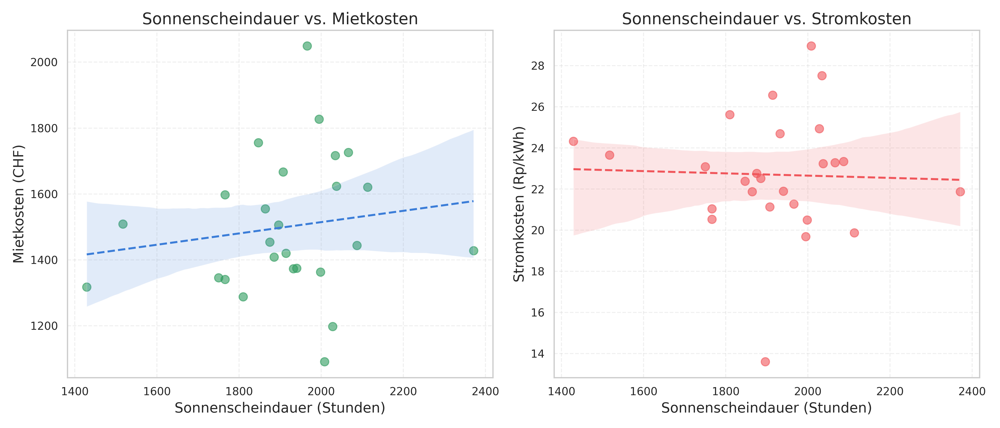

In [ ]:
# Zeige das Bild an, das im angegebenen Pfad gespeichert ist
Image(filename='/content/drive/MyDrive/ie_scripting_datasets/sonnenscheindauer_vs_miet_stromkosten.png')


# Karte mit Mietkosten, Stromkosten und Sonnenscheindauer

Im Rahmen der Analyse wurde zusätzlich eine Karte erstellt, die die geografische Verteilung der **Mietkosten**, **Stromkosten** und **Sonnenscheindauer** für die Schweizer Kantone interaktiv visualisiert. Diese Karte hilft die Unterschiede auf einen Blick zu erkennen. Im Jupyter-Notebook (zum Visualisierungsteil) ist eine interaktive Version dieser Karte integriert. So kann je nach Bedrüfniss gezoomt werden, die Werte der einzelnen Kantone können in der interaktiven Karte als Tooltipp angezeigt werden.

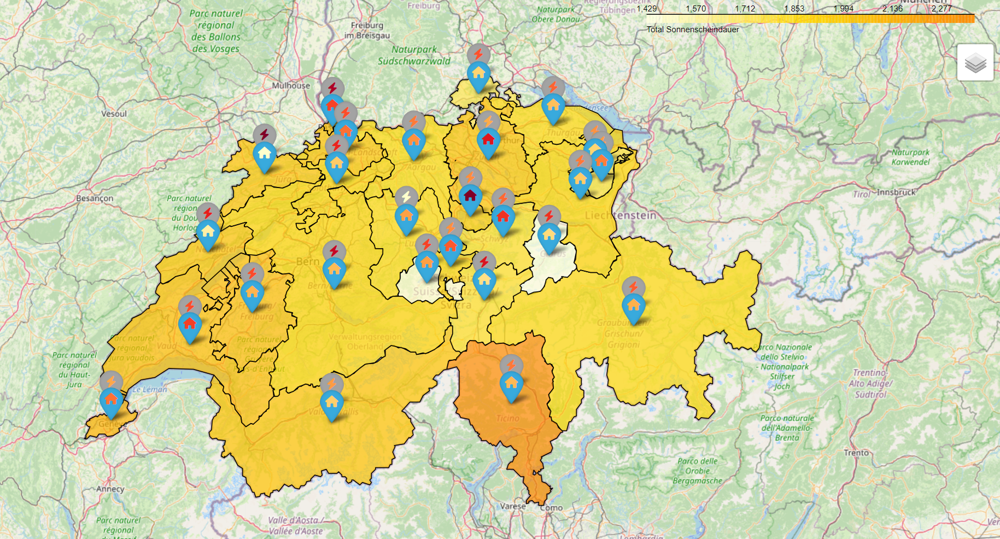

In [ ]:
# Pfad und Anzeige der Karte (statisch)
Image(filename='/content/drive/MyDrive/ie_scripting_datasets/Karte_Sonnenschein_Miete_Stromkosten.png')


## Erstellung und Formatierung der Tabelle mit Attraktivitäts-Score

Zusätzlich wurde eine Tabelle erstellt, die den Attraktivitäts-Score sowie die **Mietkosten**, die **Sonnenscheindauer** und die **Stromkosten** der Schweizer Kantone zeigt. Der Attraktivitäts-Score der Kantone ist visuell hervorgehoben. Durch einen Farbverlauf wird dieser in der Tabelle angezeigt, um die Unterschiede zwischen den Kantonen klar und deutlich erkennbar zu machen.

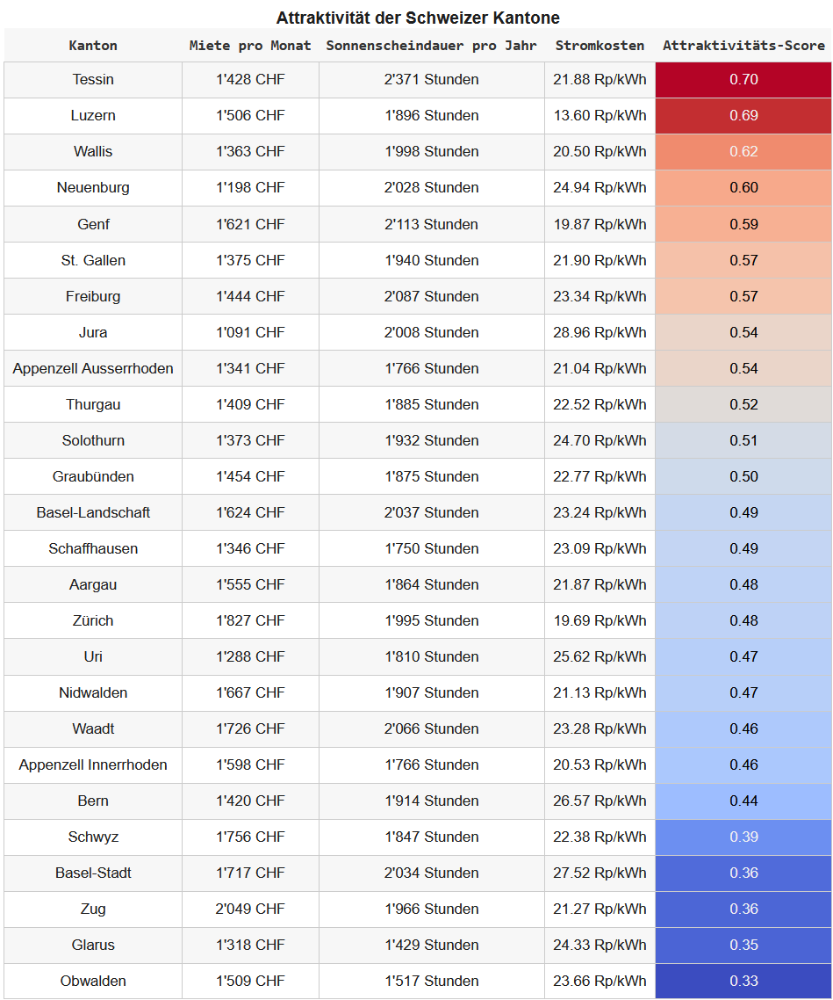

In [ ]:
# Zeige das Bild an, das im angegebenen Pfad gespeichert ist
Image(filename='/content/drive/MyDrive/ie_scripting_datasets/attraktivitaetstabelle.png')
